In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Kütüphaneleri Yüklüyorum
import os
import random
import math
import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Reshape, UpSampling2D, Conv2D, BatchNormalization
from tensorflow.keras.layers import LeakyReLU, Dropout, ZeroPadding2D, Flatten, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow import keras
from tensorflow.keras.preprocessing.image import load_img, array_to_img
import warnings
#warnings.filterwarnings("ignore")

In [ ]:
!pip install opendatasets

In [ ]:
#veri seti copy API command

import opendatasets as od
import pandas

od.download(
    "https://www.kaggle.com/datasets/splcher/animefacedataset?select=images")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: aysegulbulbul
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset


100%|██████████| 395M/395M [00:19<00:00, 21.6MB/s]


In [ ]:
#Data IMPORT
data_path ="/content/animefacedataset/images"
batch_s = 16

data = tf.keras.preprocessing.image_dataset_from_directory(data_path, label_mode = None,
                                                           image_size = (64,64),
                                                           batch_size = batch_s)
data = data.map(lambda x: x / 255.0)

Found 63565 files belonging to 1 classes.


In [ ]:
data_shape = data.element_spec
print(f"Data element shape: {data_shape}")

Data element shape: TensorSpec(shape=(None, 64, 64, 3), dtype=tf.float32, name=None)


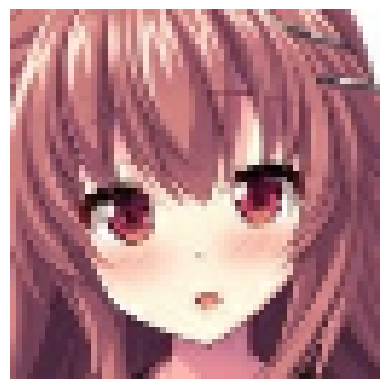

In [ ]:
for x in data:
    plt.axis("off")
    plt.imshow((x.numpy() * 255).astype("int32")[0])
    break

#GENERATOR


In [ ]:
# Generatör modeli tanımlıyoruz
latent_dim = 100
# Modelin girdisi: modelin karmaşıklık düzeyini ve üretebileceği çıktıların çeşitliliğini etkiler.
#100: gürültü vektörü ayısı

generator = Sequential()

generator.add(Dense(8*8*512, activation="relu", input_dim=latent_dim))
generator.add(Reshape((8, 8, 512)))
generator.add(UpSampling2D())   # verilerin daha yüksek çözünürlükte görselleştirilmesine ve daha fazla detayın yakalanmasına yardımcı olur.
generator.add(Conv2D(256, kernel_size=3, padding="same"))
generator.add(BatchNormalization(momentum=0.8))    #Gradiant güncellemeleri daha tutarlı olması için
generator.add(Activation("relu"))                  # daha karmaşık ilişkileri öğrenmesine yardımcı olur.
generator.add(UpSampling2D())
generator.add(Conv2D(128, kernel_size=3, padding="same"))
generator.add(BatchNormalization(momentum=0.8))
generator.add(Activation("relu"))
generator.add(UpSampling2D())
generator.add(Conv2D(64, kernel_size=3, padding="same"))
generator.add(BatchNormalization(momentum=0.8))
generator.add(Activation("relu"))
generator.add(Conv2D(3, kernel_size=3, padding="same"))
generator.add(Activation("tanh"))
# Model özetini göster
generator.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32768)             3309568   
                                                                 
 reshape (Reshape)           (None, 8, 8, 512)         0         
                                                                 
 up_sampling2d (UpSampling2  (None, 16, 16, 512)       0         
 D)                                                              
                                                                 
 conv2d (Conv2D)             (None, 16, 16, 256)       1179904   
                                                                 
 batch_normalization (Batch  (None, 16, 16, 256)       1024      
 Normalization)                                                  
                                                                 
 activation (Activation)     (None, 16, 16, 256)       0

(-0.5, 63.5, 63.5, -0.5)

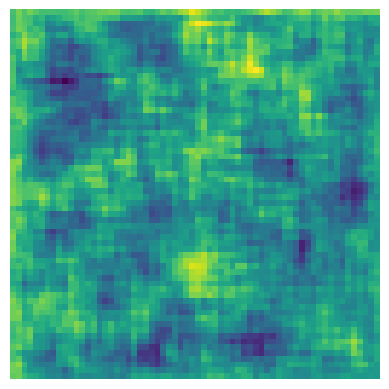

In [ ]:
#Jeneratörden rastgele bir tohum ve çıktı oluşturma
seed = tf.random.normal([1, latent_dim])
Generated_Anime = generator(seed, training=False)

#Plotting

plt.imshow(Generated_Anime[0, :, :, 0])
plt.axis("off")

#DISCRIMINATOR

In [ ]:
#Building a Discriminator

discriminator = Sequential()

discriminator.add(Conv2D(32, kernel_size=3, strides=2, input_shape=(64,64,3), padding="same"))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(64, kernel_size=3, strides=2, padding="same"))
discriminator.add(ZeroPadding2D(padding=((0,1),(0,1))))
discriminator.add(BatchNormalization(momentum=0.8))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(128, kernel_size=3, strides=2, padding="same"))
discriminator.add(BatchNormalization(momentum=0.8))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(256, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.8))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Conv2D(512, kernel_size=3, strides=1, padding="same"))
discriminator.add(BatchNormalization(momentum=0.8))
discriminator.add(LeakyReLU(alpha=0.2))
discriminator.add(Dropout(0.25))
discriminator.add(Flatten())
discriminator.add(Dense(1, activation="sigmoid"))

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 zero_padding2d (ZeroPaddin  (None, 17, 17, 64)        0         
 g2D)                                                            
                                                                 
 batch_normalization_3 (Bat  (None, 17, 17, 64)        256       
 chNormalization)                                     

In [ ]:

Discriminator_Verdict = discriminator(Generated_Anime)
print (Discriminator_Verdict)

tf.Tensor([[0.49960965]], shape=(1, 1), dtype=float32)


Ayırt edicinin çıktısı, yani Karar, görüntünün gerçek olma ihtimalinin neredeyse yüzde elli olduğunu söylüyor. Bunun nedeni Ayırıcının henüz eğitilmemiş olmamasıdır.

#GAN TRAINING

İlk olarak discriminatör eğitilicek. Sahte ve gerçek veileri ayırt etmesi için. Daha sonra generator discriminatörün tahminlerini kullanarak eğitilicek.Generatöre, discriminatörü kandırmaya çalışmak için ağırlıkları ayarlama yetkisi veriliyor. Bu birkaç defa tekrarlanıyor.
GAN fonksiyonuyla hem generatör hem discriminatör aynı anda eğitiliyor.

In [ ]:
class GAN(tf.keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(GAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        self.d_loss_metric = tf.keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = tf.keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # Gizli uzaydaki rasgele noktalar
        batch_size = tf.shape(real_images)[0]
        seed = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Sahte görüntülere dönüştürme
        generated_images = self.generator(seed)

        # Bunları gerçek görüntülerle birleştirme
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # Gerçek görselleri sahte görsellerden ayıran etiketleri birleştirilir
        labels = tf.concat([tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0)

        # Etiketlere rasgele gürültüeklenir
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # DİSCRİMİNATÖR EĞİTİMİ
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)               #Üretilen ve görüntüleri birleştirmiş(combined_images) üzerinde tahminde bulunuyor.
            d_loss = self.loss_fn(labels, predictions)                     #Discr. tahminleri ile gerçek etiketler arasındaki kayıp hesaplanıyor.
        grads = tape.gradient(d_loss, self.discriminator.trainable_weights) #Kayıp(loss) değerleri kullanılarak gradyanlar hesaplanır (backpropagation)
        self.d_optimizer.apply_gradients(zip(grads, self.discriminator.trainable_weights)) #Gradyanlar ile discriminatör ağırlıkları güncellenir

        # Gizli uzaydaki rastgele noktalar
        seed = tf.random.normal(shape=(batch_size, self.latent_dim))

        # Gerçek görüntüleri temsil etmeyen yanıltıcı görüntüler."
        misleading_labels = tf.zeros((batch_size, 1))

        # GENERATÖR EĞİTİMİ (Bu eğitimi yaparken discriminatörün ağırlıklarını güncellemememiz gerekli. Çünkü generatörün öğrenmesi zor olabilir)
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(seed))       #Generator, rastgele bir latent vektörden (seed) üretilen görüntüleri Discriminator'a ileterek tahminlerde bulunur.
            g_loss = self.loss_fn(misleading_labels, predictions)         #Discriminator'ın Generator'ı yanıltması için üretilen görüntülerin tahminleri ile yanıltıcı etiketler arasındaki kayıp (g_loss) hesaplanır.
        grads = tape.gradient(g_loss, self.generator.trainable_weights)   #Kayıp (g_loss) değeri kullanılarak gradyanlar hesaplanır.
        self.g_optimizer.apply_gradients(zip(grads, self.generator.trainable_weights))  #Ağırlıklar güncellenir.

        # METRİKLERİN GÜNCELLENMESİ :Discriminator ve Generatör kaybını izleyen ölçüm metrikleri güncellenir.

        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {"d_loss": self.d_loss_metric.result(),
                "g_loss": self.g_loss_metric.result()}

In [ ]:
class DCGANMonitor(keras.callbacks.Callback):
    def __init__(self, num_imgs=15, latent_dim=100):
        self.num_imgs = num_imgs
        self.latent_dim = latent_dim
        # görüntü oluşturmak için rastgele gürültü
        self.noise = tf.random.normal([15, latent_dim])

    def on_epoch_end(self, epoch, logs=None):
        #gürültüden görüntü oluşturma
        g_img = self.model.generator(self.noise)
        # görüntüyü normalleştirme
        g_img = (g_img * 127.5) + 127.5
        g_img.numpy()

        fig = plt.figure(figsize=(8, 8))
        for i in range(self.num_imgs):
            plt.subplot(5, 5, i+1)
            img = array_to_img(g_img[i])
            plt.imshow(img)
            plt.axis('off')
        # plt.savefig('epoch_{:03d}.png'.format(epoch))
        plt.show()

    def on_train_end(self, logs=None):
        self.model.generator.save('/content/drive/MyDrive/generator2.h5')

#TRAINING THE MODEL

Epoch 1/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6653 - g_loss: 0.8177

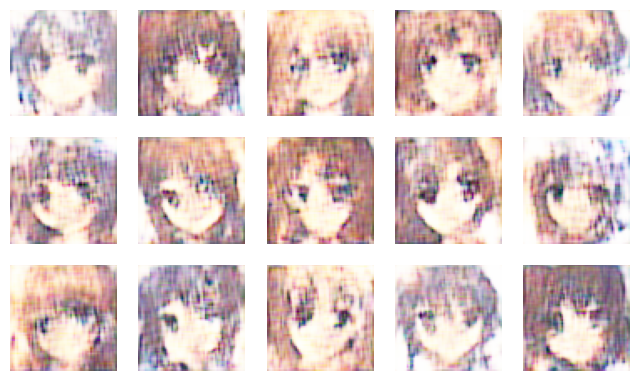

3973/3973 [==============================] - 183s 43ms/step - d_loss: 0.6653 - g_loss: 0.8177
Epoch 2/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6779 - g_loss: 0.7883

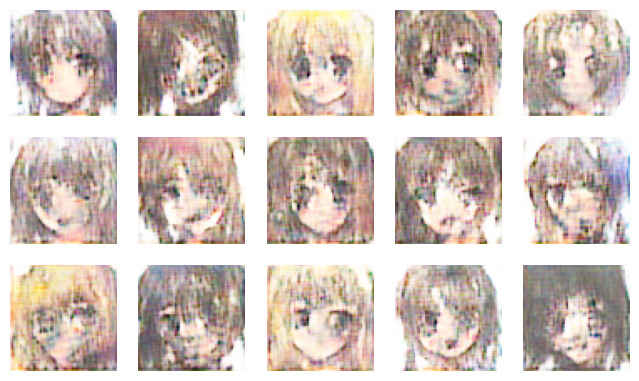

3973/3973 [==============================] - 171s 43ms/step - d_loss: 0.6779 - g_loss: 0.7883
Epoch 3/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6825 - g_loss: 0.7780

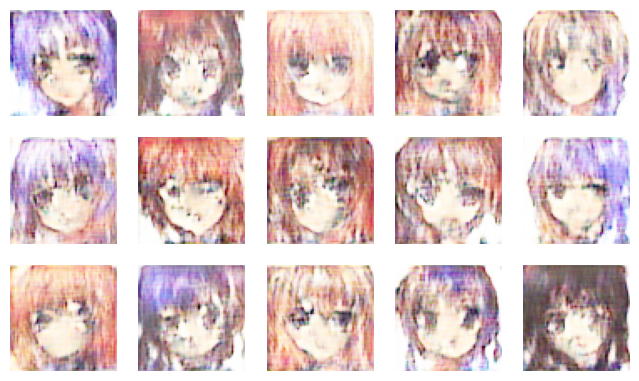

3973/3973 [==============================] - 171s 43ms/step - d_loss: 0.6825 - g_loss: 0.7780
Epoch 4/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6803 - g_loss: 0.7865

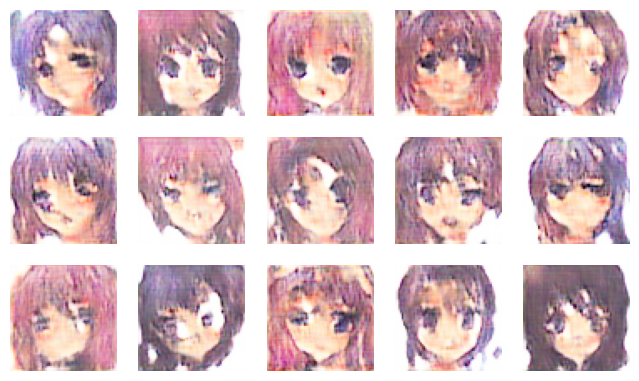

3973/3973 [==============================] - 172s 43ms/step - d_loss: 0.6803 - g_loss: 0.7865
Epoch 5/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6556 - g_loss: 0.8511

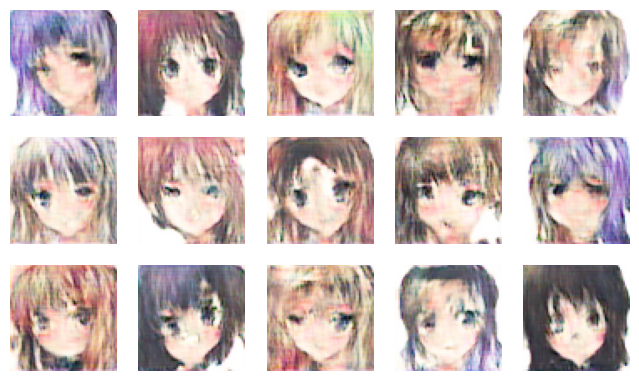

3973/3973 [==============================] - 171s 43ms/step - d_loss: 0.6556 - g_loss: 0.8511
Epoch 6/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6682 - g_loss: 0.8222

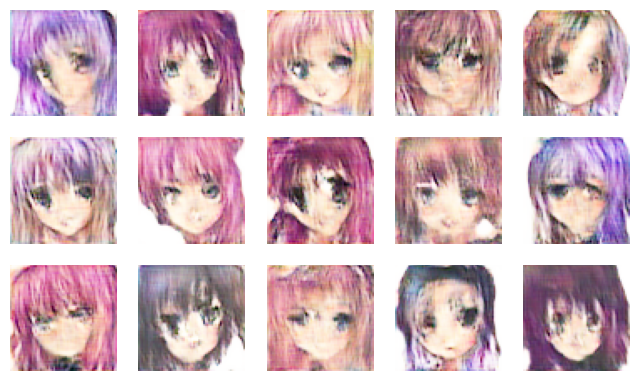

3973/3973 [==============================] - 173s 43ms/step - d_loss: 0.6682 - g_loss: 0.8222
Epoch 7/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6676 - g_loss: 0.8206

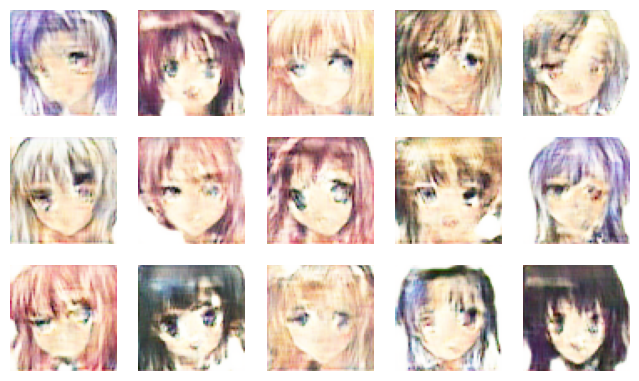

3973/3973 [==============================] - 175s 44ms/step - d_loss: 0.6676 - g_loss: 0.8206
Epoch 8/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6684 - g_loss: 0.8226

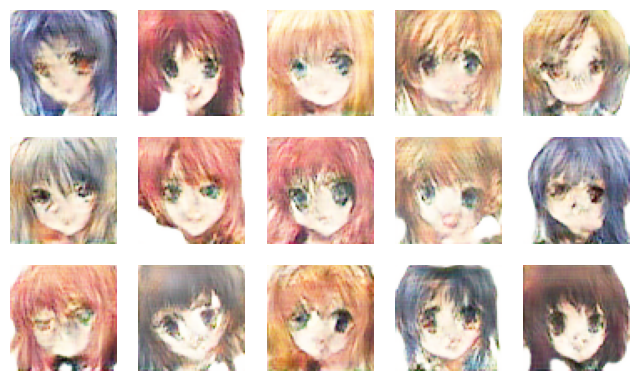

3973/3973 [==============================] - 175s 44ms/step - d_loss: 0.6684 - g_loss: 0.8226
Epoch 9/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6666 - g_loss: 0.8262

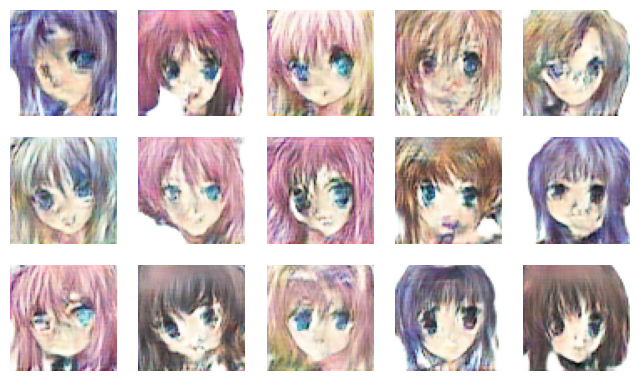

3973/3973 [==============================] - 181s 46ms/step - d_loss: 0.6666 - g_loss: 0.8263
Epoch 10/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6634 - g_loss: 0.8315

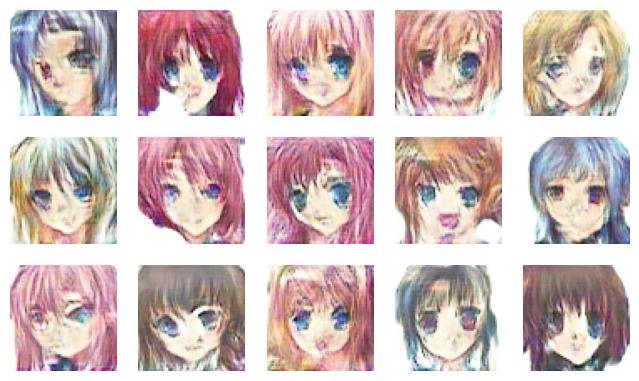

3973/3973 [==============================] - 181s 46ms/step - d_loss: 0.6634 - g_loss: 0.8315
Epoch 11/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6600 - g_loss: 0.8419

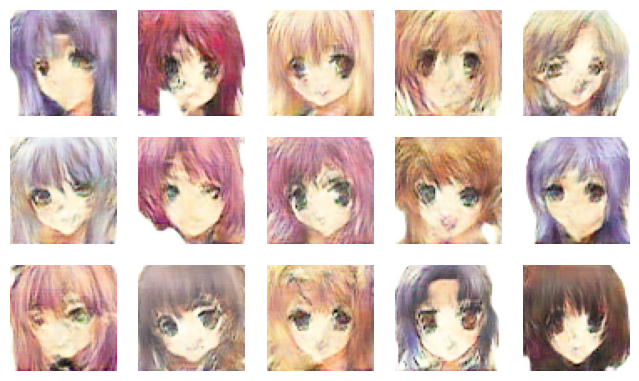

3973/3973 [==============================] - 183s 46ms/step - d_loss: 0.6600 - g_loss: 0.8418
Epoch 12/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6568 - g_loss: 0.8468

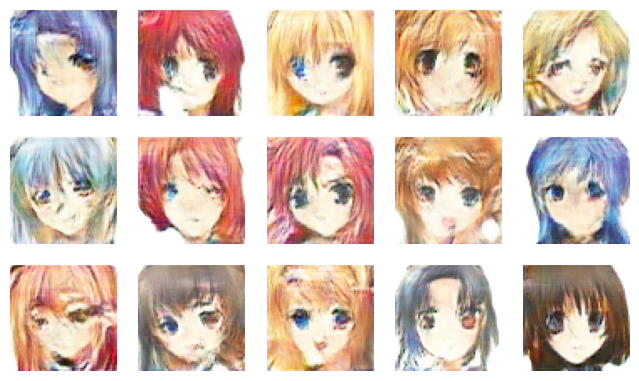

3973/3973 [==============================] - 183s 46ms/step - d_loss: 0.6568 - g_loss: 0.8468
Epoch 13/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6530 - g_loss: 0.8582

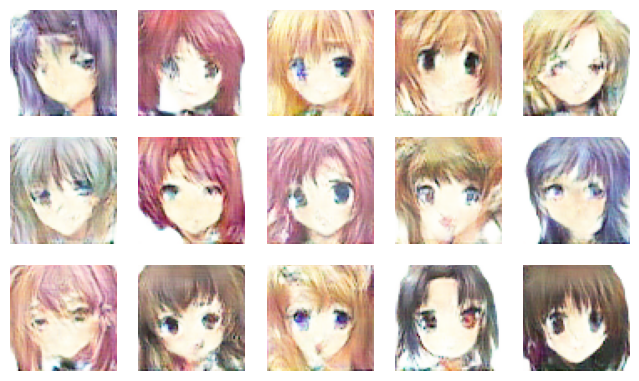

3973/3973 [==============================] - 182s 46ms/step - d_loss: 0.6530 - g_loss: 0.8582
Epoch 14/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6459 - g_loss: 0.8774

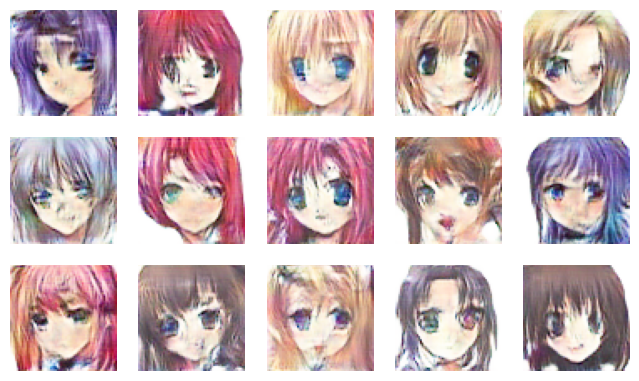

3973/3973 [==============================] - 181s 46ms/step - d_loss: 0.6459 - g_loss: 0.8774
Epoch 15/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6384 - g_loss: 0.8954

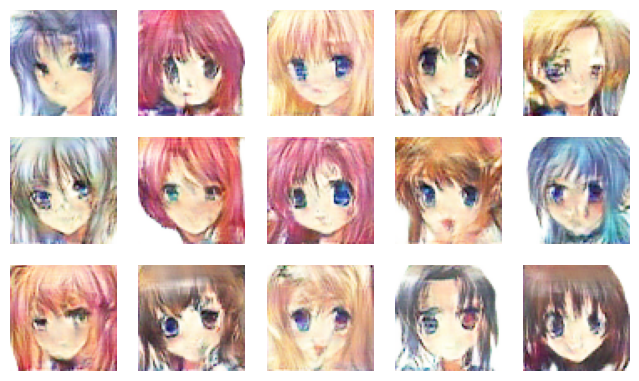

3973/3973 [==============================] - 181s 46ms/step - d_loss: 0.6384 - g_loss: 0.8954
Epoch 16/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6297 - g_loss: 0.9148

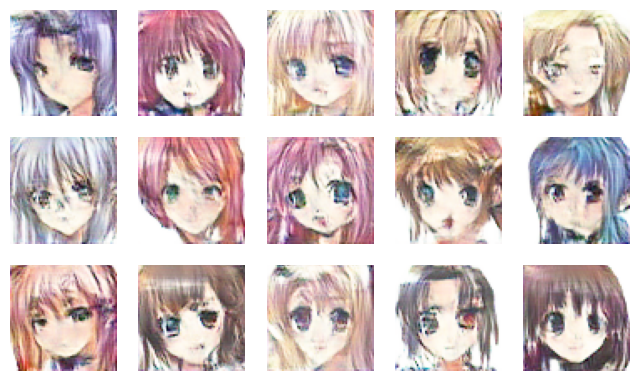

3973/3973 [==============================] - 181s 46ms/step - d_loss: 0.6298 - g_loss: 0.9149
Epoch 17/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6228 - g_loss: 0.9341

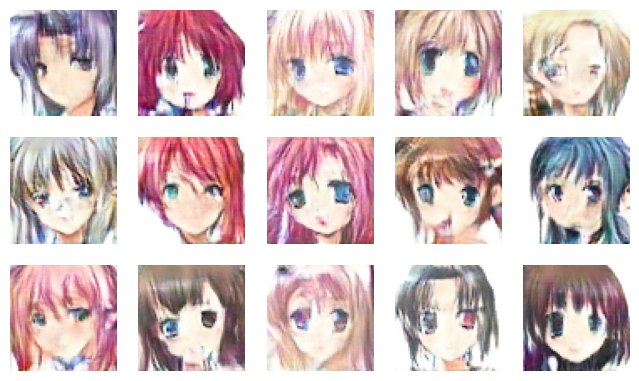

3973/3973 [==============================] - 182s 46ms/step - d_loss: 0.6228 - g_loss: 0.9342
Epoch 18/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.6150 - g_loss: 0.9558

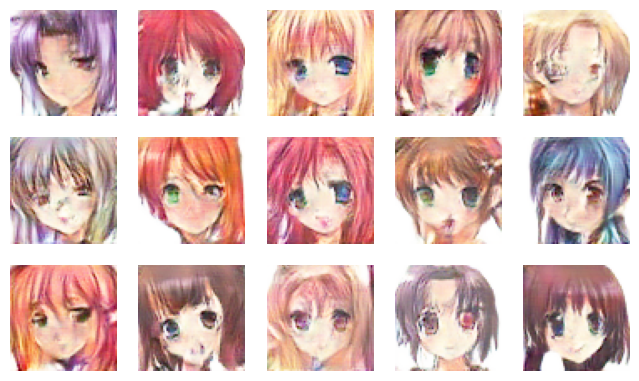

3973/3973 [==============================] - 181s 46ms/step - d_loss: 0.6150 - g_loss: 0.9558
Epoch 19/25
3972/3973 [============================>.] - ETA: 0s - d_loss: 0.6059 - g_loss: 0.9764

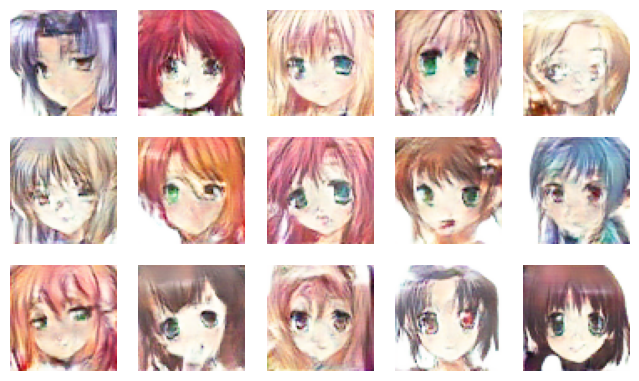

3973/3973 [==============================] - 183s 46ms/step - d_loss: 0.6058 - g_loss: 0.9764
Epoch 20/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.5975 - g_loss: 1.0061

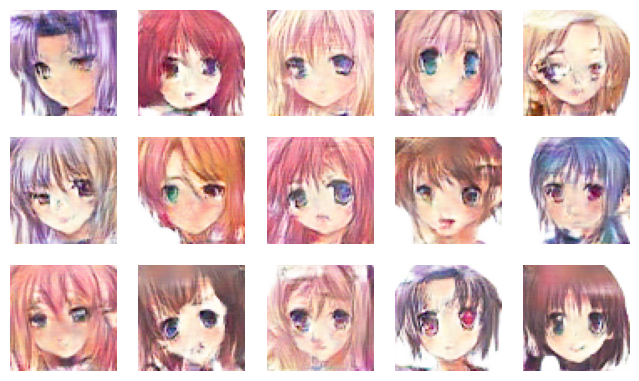

3973/3973 [==============================] - 183s 46ms/step - d_loss: 0.5975 - g_loss: 1.0061
Epoch 21/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.5881 - g_loss: 1.0277

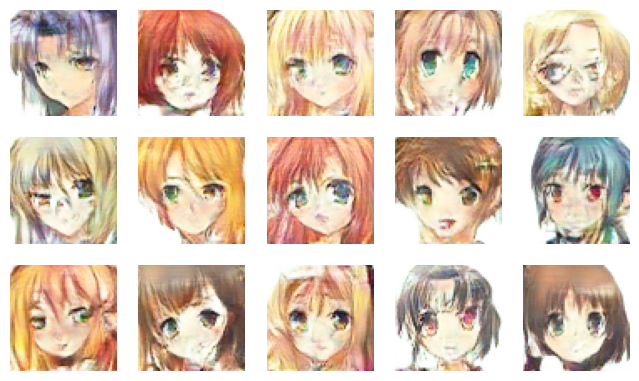

3973/3973 [==============================] - 176s 44ms/step - d_loss: 0.5881 - g_loss: 1.0277
Epoch 22/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.5786 - g_loss: 1.0582

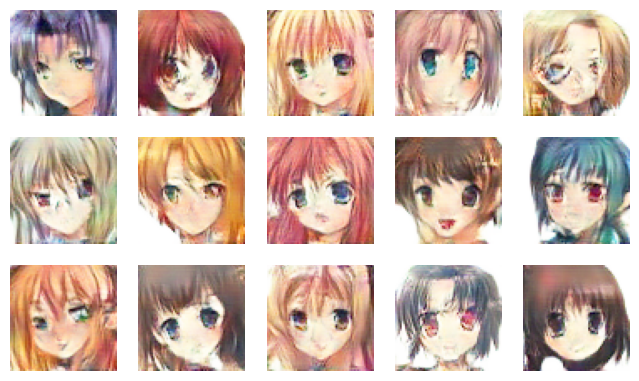

3973/3973 [==============================] - 173s 43ms/step - d_loss: 0.5786 - g_loss: 1.0582
Epoch 23/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.5668 - g_loss: 1.0923

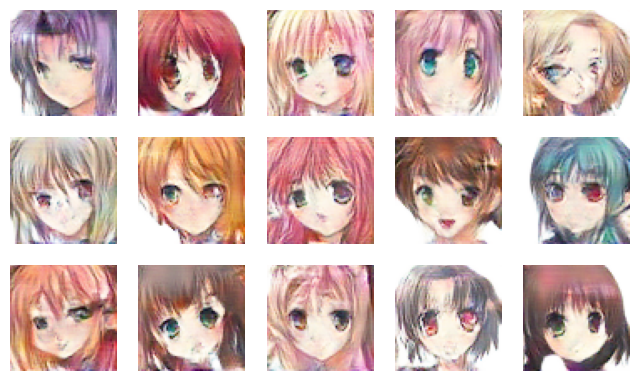

3973/3973 [==============================] - 172s 43ms/step - d_loss: 0.5668 - g_loss: 1.0923
Epoch 24/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.5553 - g_loss: 1.1297

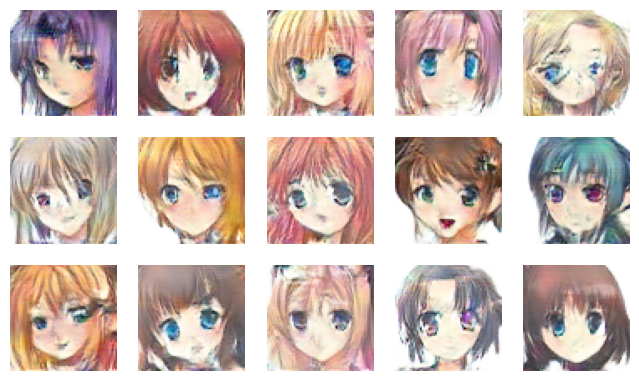

3973/3973 [==============================] - 171s 43ms/step - d_loss: 0.5553 - g_loss: 1.1297
Epoch 25/25
3973/3973 [==============================] - ETA: 0s - d_loss: 0.5449 - g_loss: 1.1731

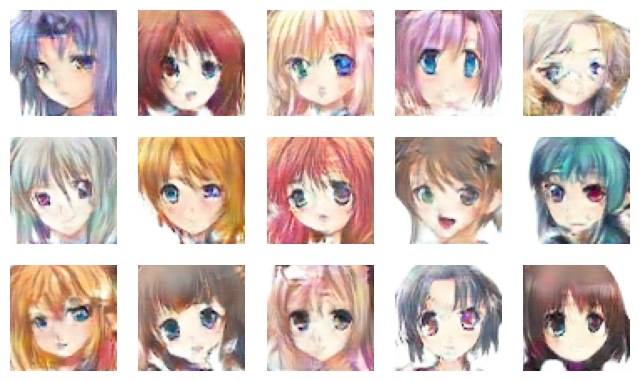

3973/3973 [==============================] - 173s 43ms/step - d_loss: 0.5449 - g_loss: 1.1731


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# EPOCH SAYISI
epochs = 25

# Generator ve Discriminator için optimizie ediciler
discriminator_opt = tf.keras.optimizers.Adamax(1.5e-4,0.5)
generator_opt = tf.keras.optimizers.Adamax(1.5e-4,0.5)

# Crossentropy kaybını hesaplamak için
loss_fn = tf.keras.losses.BinaryCrossentropy()

# GAN Modelini tanımlama
model = GAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Gan modelini derleme
model.compile(d_optimizer=discriminator_opt, g_optimizer=generator_opt, loss_fn=loss_fn)

# GAN EĞİTİMİ
history = model.fit(data, epochs=epochs, callbacks=[DCGANMonitor()],batch_size=16)
#history = model.fit(data, epochs=epochs,batch_size=16)

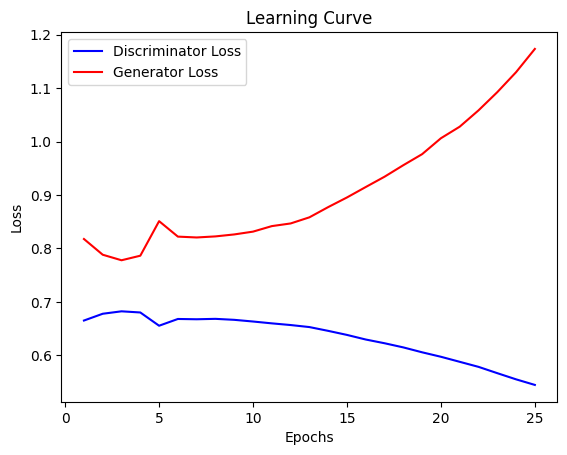

<Figure size 640x480 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt

# d_loss ve g_loss değerlerini aldım
d_loss = history.history['d_loss']
g_loss = history.history['g_loss']

# Eğitim sürecinin epoch sayısını belirttim
epochs = range(1, len(d_loss) + 1)

# d_loss ve g_loss için öğrenme eğrilerini

plt.plot(epochs, d_loss, 'b', label='Discriminator Loss')
plt.plot(epochs, g_loss, 'r', label='Generator Loss')
plt.title('Learning Curve')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
plt.savefig("anime.png")


In [ ]:
#Oluşturulacak görüntü sayısı
num_img=20

##Görüntü oluşturma ve kaydetme
def Anime_Generator():
    Generated_Paintings = []
    seed = tf.random.normal([num_img, latent_dim])
    generated_image = generator(seed)
    generated_image *= 255
    generated_image = generated_image.numpy()

    for i in range(num_img):
            img = tf.keras.preprocessing.image.array_to_img(generated_image[i])
            Generated_Paintings.append(img)
            img.save("Anime{:02d}.jpg".format(i))
    return

#Generating images
Images = Anime_Generator()